# Variable description

### Background study to gain the domain expertise to find the appropriate relationships

# 🌞 Relationships Between Solar and Environmental Variables

## 1. ☀ Solar Radiation and Solar Energy

**Solar Radiation (W/m²)** represents the instantaneous measure of sunlight energy received at a specific location.

**Solar Energy (MJ/m²)** is the cumulative energy received over time, typically aggregated daily, hourly, or monthly. The conversion from solar radiation to solar energy involves integrating radiation over time:

$$ \text{Solar Energy (MJ/m}^2\text{)} = \int \text{Solar Radiation (W/m}^2\text{)} \, dt $$

---

## 2. 🔋 Solar Radiation, Solar Energy, and PV Output

**PV Output (kWh)** depends significantly on solar radiation, as photovoltaic (PV) panels convert sunlight into electricity. Several factors affect this conversion:

- **Solar Energy** - More solar energy generally results in higher PV output, assuming constant efficiency.
- **Panel Efficiency** - Determines how much of the solar energy is converted to electricity.
- **Panel Area** - Affects the total energy captured.

A simplified relationship can be expressed as:

$$ \text{PV Output (kWh)} \approx \text{Solar Energy (MJ/m}^2\text{)} \times \text{Panel Efficiency} \times \text{Panel Area} \times \text{Conversion Factor} $$

where the conversion factor adjusts MJ to kWh.

---

## 3. 🌦 Weather Variables Affecting Solar Radiation

- **Cloud Cover (%)** - More clouds mean less sunlight reaches the panels, reducing both solar energy and PV output.
- **Humidity** - Can influence cloud formation and atmospheric scattering, indirectly affecting solar radiation.
- **Pressure (millibars)** - While not directly affecting solar radiation, pressure changes can indicate weather patterns influencing cloud cover.

---

## 4. 🌡 Temperature Effects

- **Temp Min & Temp Max** - Temperature fluctuations impact PV panel efficiency:
  - High temperatures decrease efficiency due to increased electrical resistance and overheating.
  - Low temperatures can improve efficiency slightly but might coincide with reduced solar radiation due to overcast or snowy conditions.

---

## 5. 🛡 UV Index

The **UV Index** indicates solar intensity, particularly in the shorter wavelength range. While PV panels primarily use visible and infrared light, high UV indices often correlate with strong solar radiation. UV levels are influenced by:

- **Cloud Cover** - Can significantly reduce UV radiation.
- **Altitude** - Higher altitudes receive more UV radiation due to reduced atmospheric filtering.

---

## 6. 🌧 Precipitation and PV Output

**Precipitation (mm)** can influence PV performance by:

- **Cleaning Panels** - Light rain can wash away dust and improve efficiency.
- **Obstructing Sunlight** - Heavy rain and cloud cover reduce solar radiation, lowering PV output.

---

This document provides insights into how solar radiation, environmental factors, and PV output are interconnected. Understanding these relationships helps optimize solar energy utilization and forecasting. 🌎⚡


### Importing and validating the dataframe

In [3]:
import numpy as np 
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import time
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import plotly.graph_objects as go
import logging
import time
from functools import wraps
import os
from typing import Any, Callable
import polars as pl
import dask.dataframe as dd
from ydata_profiling import ProfileReport
from scipy.stats import shapiro
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from scipy import stats
from statsmodels.stats.stattools import omni_normtest

### Setting up the basic utility functions like logger and execution time counter

In [4]:
class Logger:
    """Custom logger class for consistent logging across the application"""
    
    def __init__(self, name: str, log_file: str = 'app.log', level: int = logging.INFO):
        self.logger = logging.getLogger(name)
        self.logger.setLevel(level)
        
        # Prevent adding multiple handlers
        if not self.logger.hasHandlers():
            formatter = logging.Formatter('%(asctime)s - %(name)s - %(levelname)s - %(message)s')

            # Create log directory if needed
            if log_file and os.path.dirname(log_file):
                os.makedirs(os.path.dirname(log_file), exist_ok=True)
            
            # File handler
            file_handler = logging.FileHandler(log_file)
            file_handler.setFormatter(formatter)
            self.logger.addHandler(file_handler)

            # Console handler
            console_handler = logging.StreamHandler()
            console_handler.setFormatter(formatter)
            self.logger.addHandler(console_handler)
    
    def get_logger(self) -> logging.Logger:
        return self.logger

def timer_decorator(func: Callable) -> Callable:
    """Decorator to measure execution time of functions"""
    @wraps(func)
    def wrapper(*args, **kwargs):
        start_time = time.time()
        result = func(*args, **kwargs)
        end_time = time.time()
        execution_time = end_time - start_time

        # Fetch or create a logger
        logger = kwargs.get('logger')
        if logger is None:
            logger = Logger(func.__module__).get_logger()

        logger.info(f"Function {func.__name__} took {execution_time:.4f} seconds")
        return result
    return wrapper


## Utils for loading dataframe 

In [9]:

class DataFrameUtils:
    """Utility class for common DataFrame operations across different libraries"""
    @staticmethod
    @timer_decorator
    def load_data(df: Any, logger: logging.Logger = None) -> Any:
        """Display first `n` rows of DataFrame, handling different DataFrame types"""
        
        if logger is None:
            logger = Logger('DataFrameUtils').get_logger()
        
        try:
            return df
        except Exception as e:
            logger.error(f"Error displaying head: {str(e)}")
            raise
    @staticmethod
    @timer_decorator
    def display_head(df: Any, n: int = 5, logger: logging.Logger = None) -> Any:
        """Display first `n` rows of DataFrame, handling different DataFrame types"""
        
        if logger is None:
            logger = Logger('DataFrameUtils').get_logger()
        
        try:
            return df.head(n)
        except Exception as e:
            logger.error(f"Error displaying head: {str(e)}")
            raise

    @staticmethod
    @timer_decorator
    def display_info(df: Any, logger: logging.Logger = None) -> None:
        """Display DataFrame info, describe, and column names safely"""
        
        if logger is None:
            logger = Logger('DataFrameUtils').get_logger()

        try:
            if df is None:
                logger.error("DataFrame is None. Cannot display info.")
                return
            
            logger.info("Displaying DataFrame info:")

            if isinstance(df, pd.DataFrame):
                return [df.info(), df.describe(), df.columns]
            else:
                logger.error("cannot display dataframe information.")
                
        except Exception as e:
            logger.error(f"Error while displaying DataFrame info: {str(e)}")
            raise

# Simple Exploratory data analysis Utils

In [5]:
class EDAUtils:
    """Utility class for performing Exploratory Data Analysis (EDA)"""
    @staticmethod
    @timer_decorator
    def generate_profile_report(df: Any, logger: logging.Logger = None, title: str = "Pandas Profiling Report") -> None:
        """Generate an interactive Pandas Profiling report."""
        try:
            logger.info("Generating Pandas Profiling report...")
            profile = ProfileReport(df, title=title, explorative=True)
            profile.to_notebook_iframe()  # Display report in Jupyter Notebook
            logger.info("Pandas Profiling report generated successfully.")
        except Exception as e:
            logger.error(f"Error generating Pandas Profiling report: {str(e)}")
            raise

# Step 1 -> Data pre processing

In [6]:
def data_preprocessing():
    logger = Logger('MainApp', 'logs/app.log').get_logger()
    
    data_file = "solarPower_50m.csv"
    
    # Ensuring the file exists in the path
    if not os.path.exists(data_file):
        logger.error(f"The  '{data_file}'is not found in the path")
        return

    # Reading the dataframe
    df_pandas = pd.read_csv(data_file)

    # Use DataFrame utilities
    logger.info("Displaying pandas DataFrame head")
    result_pd = DataFrameUtils.display_head(df_pandas, logger=logger)
    display(result_pd)

    logger.info("Displaying pandas DataFrame info")
    result_pd = DataFrameUtils.display_info(df_pandas, logger=logger)
    for i in result_pd:
        display(i)
    
    # Use EDA utilities
    eda = EDAUtils()
    display(eda.generate_profile_report(df_pandas, logger=logger))
    

if __name__ == "__main__":
    data_preprocessing()


2025-02-14 09:08:36,428 - MainApp - INFO - Displaying pandas DataFrame head
2025-02-14 09:08:36,501 - MainApp - INFO - Function display_head took 0.0002 seconds


,Unnamed: 0,precip,cloud cover,solar radiation,humidity,pressure,UV index,temp min,temp max,solar energy,PV output
0,2019-12-01,0.000,72.0,27.9,87.3,1024.4,2.0,0.9,5.4,2.4,0.748
1,2019-12-02,0.120,41.2,NaN,82.0,1032.6,2.0,-1.1,5.8,3.9,1.122
2,2019-12-03,0.000,59.8,42.5,82.6,1027.7,3.0,2.1,8.2,3.7,1.091
3,2019-12-04,0.096,26.2,43.8,90.6,1020.7,3.0,1.0,6.9,3.7,1.060
4,2019-12-05,0.134,85.2,26.5,91.5,1019.4,2.0,1.9,9.7,2.3,0.712


2025-02-14 09:08:36,618 - MainApp - INFO - Displaying pandas DataFrame info
2025-02-14 09:08:36,619 - MainApp - INFO - Displaying DataFrame info:
2025-02-14 09:08:36,707 - MainApp - INFO - Function display_info took 0.0885 seconds


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 793 entries, 0 to 792
Data columns (total 11 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Unnamed: 0       793 non-null    object 
 1   precip           793 non-null    float64
 2   cloud cover      793 non-null    float64
 3   solar radiation  760 non-null    float64
 4   humidity         793 non-null    float64
 5   pressure         792 non-null    float64
 6   UV index         793 non-null    float64
 7   temp min         793 non-null    float64
 8   temp max         793 non-null    float64
 9   solar energy     793 non-null    float64
 10  PV output        793 non-null    float64
dtypes: float64(10), object(1)
memory usage: 68.3+ KB


None

,precip,cloud cover,solar radiation,humidity,pressure,UV index,temp min,temp max,solar energy,PV output
count,793.000000,793.000000,760.000000,793.000000,792.000000,793.000000,793.000000,793.000000,793.000000,793.000000
mean,2.652846,66.108701,108.408684,83.719420,1015.693939,4.050441,7.019546,13.164817,9.262169,2.804861
std,4.604500,20.495106,84.538525,9.526572,11.456059,2.471040,4.598832,5.340954,7.247400,2.044960
min,0.000000,0.000000,7.200000,47.700000,975.100000,0.000000,-3.900000,-0.100000,0.700000,0.078000
25%,0.024000,53.400000,32.450000,78.500000,1008.300000,2.000000,3.400000,9.400000,2.800000,0.855000
50%,0.506000,68.200000,88.400000,85.400000,1016.750000,4.000000,7.200000,12.200000,7.400000,2.462000
75%,3.340000,82.200000,165.550000,91.000000,1023.700000,6.000000,10.700000,17.300000,14.100000,4.566000
max,36.276000,100.000000,319.700000,98.900000,1048.400000,10.000000,18.300000,29.700000,27.700000,6.873000


Index(['Unnamed: 0', 'precip', 'cloud cover', 'solar radiation', 'humidity',
       'pressure', 'UV index', 'temp min', 'temp max', 'solar energy',
       'PV output'],
      dtype='object')

2025-02-14 09:08:36,729 - MainApp - INFO - Generating Pandas Profiling report...


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

2025-02-14 09:08:52,541 - MainApp - INFO - Pandas Profiling report generated successfully.
2025-02-14 09:08:52,681 - MainApp - INFO - Function generate_profile_report took 15.9518 seconds


None

# 📌 Key take aways 



### 🌟 Basic data statistics 



---

## 📊 Variable Information
|          | precip   | cloud cover | solar radiation | humidity | pressure  | UV index | temp min | temp max | solar energy | PV output |
|----------|----------|-------------|------------------|----------|-----------|----------|----------|----------|--------------|-----------|
| count    | 793.000000 | 793.000000   | 760.000000        | 793.000000 | 792.000000 | 793.000000 | 793.000000 | 793.000000 | 793.000000    | 793.000000 |
| mean     | 2.652846  | 66.108701    | 108.408684        | 83.719420 | 1015.693939 | 4.050441  | 7.019546  | 13.164817 | 9.262169      | 2.804861  |
| std      | 4.604500  | 20.495106    | 84.538525         | 9.526572  | 11.456059  | 2.471040  | 4.598832  | 5.340954  | 7.247400      | 2.044960  |
| min      | 0.000000  | 0.000000     | 7.200000          | 47.700000 | 975.100000 | 0.000000  | -3.900000 | -0.100000 | 0.700000      | 0.078000  |
| 25%      | 0.024000  | 53.400000    | 32.450000         | 78.500000 | 1008.300000 | 2.000000  | 3.400000  | 9.400000  | 2.800000      | 0.855000  |
| 50%      | 0.506000  | 68.200000    | 88.400000         | 85.400000 | 1016.750000 | 4.000000  | 7.200000  | 12.200000 | 7.400000      | 2.462000  |
| 75%      | 3.340000  | 82.200000    | 165.550000        | 91.000000 | 1023.700000 | 6.000000  | 10.700000 | 17.300000 | 14.100000     | 4.566000  |
| max      | 36.276000 | 100.000000   | 319.700000        | 98.900000 | 1048.400000 | 10.000000 | 18.300000 | 29.700000 | 27.700000     | 6.873000  |

---
---

## 📊 data stats
|  stat  | information |
|--------|----:|
| number of variables |  11 | 
| data points   |  793 although for some variables the information is un recorded | 
| Total memory size  |  207.8 Kib |
| Average record size  |  139.2 B|
| Total null values  | 34 where pressure has 1 and precip has 33  |


---

# step 2 Data Cleaning and Indepth analysis

In [78]:
class datacleaningutils:
    @staticmethod
    def _fill_nulls_with_window_mean(series: pd.Series, window: int = 3) -> tuple[pd.Series, list]:
        """
        Fill null values in a series with the average of 3 observations before and after.
        Returns the filled series and a list of tuples with null index, replacement value, before values, and after values.
        """
        null_info = []
        series_copy = series.copy()
        
        for idx in series[series.isnull()].index:
            before_vals = series[max(0, idx - window):idx][~series[max(0, idx - window):idx].isnull()]
            after_vals = series[idx + 1:idx + window + 1][~series[idx + 1:idx + window + 1].isnull()]
            
            before_vals = before_vals.tail(3).values
            after_vals = after_vals.head(3).values
            
            combined_vals = pd.Series(list(before_vals) + list(after_vals))
            if len(combined_vals) > 0:
                replacement_value = combined_vals.mean()
                series_copy[idx] = replacement_value
                null_info.append((idx, replacement_value, before_vals, after_vals))
            else:
                null_info.append((idx, None, before_vals, after_vals))
        
        return series_copy, null_info

    @staticmethod
    def _create_null_info_table(null_info: list) -> pd.DataFrame:
        """
        Create a DataFrame from null information for display.
        """
        return pd.DataFrame({
            'Index': [info[0] for info in null_info],
            'Replacement Value': [info[1] if info[1] is not None else 'No valid values to average' for info in null_info],
            'Before Values (up to 3)': [', '.join(map(str, info[2])) if len(info[2]) > 0 else 'None' for info in null_info],
            'After Values (up to 3)': [', '.join(map(str, info[3])) if len(info[3]) > 0 else 'None' for info in null_info]
        })

    @staticmethod
    @timer_decorator
    def format_clean_columns(df: Any, logger: logging.Logger = None) -> Any:
        """
        Renaming the columns with the appropriate name and cleaning null values.
        """
        # Set up logger if None
        if logger is None:
            logger = logging.getLogger(__name__)
            logging.basicConfig(level=logging.INFO)

        # Check if DataFrame is valid
        if not isinstance(df, pd.DataFrame):
            logger.error("Input must be a pandas DataFrame.")
            raise ValueError("Input must be a pandas DataFrame.")

        # Rename 'Unnamed: 0' to 'date' and convert to datetime
        if 'Unnamed: 0' not in df.columns:
            logger.error("The column 'Unnamed: 0' does not exist in the DataFrame.")
            raise ValueError("The column 'Unnamed: 0' does not exist in the DataFrame.")
        
        df = df.rename(columns={'Unnamed: 0': 'date'})
        logger.info("The column 'Unnamed: 0' has been renamed to 'date'")
        df['date'] = pd.to_datetime(df['date'])
        logger.info("The format of the date column has been changed to datetime")

        # List of variables to clean
        variables = ['precip', 'cloud cover', 'solar radiation', 'humidity', 
                     'pressure', 'UV index', 'temp min', 'temp max', 
                     'solar energy', 'PV output']

        # Check if all variables exist in the DataFrame
        missing_vars = [var for var in variables if var not in df.columns]
        if missing_vars:
            logger.error(f"Missing variables in DataFrame: {missing_vars}")
            raise ValueError(f"Missing variables in DataFrame: {missing_vars}")

        # Clean null values and display information
        logger.info("Replacing null values with the average of 3 observations before and after.")
        for var in variables:
            logger.info(f"Processing null values in '{var}'")
            if df[var].isnull().sum() == 0:
                logger.info(f"No null values found in '{var}'")
                print(f"\nNull values in '{var}': No null values found.")
                continue
            
            # Fill nulls and get replacement details
            df[var], null_info = datacleaningutils._fill_nulls_with_window_mean(df[var])
            logger.info(f"Filled {len(null_info)} null values in '{var}'")
            
            # Create and display null information table
            null_df = datacleaningutils._create_null_info_table(null_info)
            print(f"\nNull values in '{var}':")
            print(null_df.to_string(index=False))
            print("-" * 80)
        
        logger.info("Data cleaning completed.")
        display(df.head(10))
        return df

    @staticmethod
    @timer_decorator
    def dist_columns(df: Any, logger: logging.Logger = None) -> Any:
        """identifying the distribution of the values of the data round the mean value"""
        try:
            if df is not None:
                df = df.drop('date', axis=1)
                display("Skewness")
                display(df.skew())
                logger.info("The skewness of the data has been calculated")
                skewness = df.skew()
                positive_skew = skewness[skewness > 0].index.tolist()
                negative_skew = skewness[skewness < 0].index.tolist()
                print("Columns with Positive Skew:", positive_skew)
                print("Columns with Negative Skew:", negative_skew)
                max_skew = skewness.idxmax()
                min_skew = skewness.idxmin()
                print(f"Column with Maximum Skewness: {max_skew} (value: {skewness[max_skew]:.4f})")
                print(f"Column with Minimum Skewness: {min_skew} (value: {skewness[min_skew]:.4f})")
                display("kurtosis")
                display(df.kurtosis())
                logger.info("The kurtosis of the data has been calculated")
                kurtosis = df.kurtosis()
                positive_kurt = kurtosis[kurtosis>0].index.tolist()
                negative_kurt = kurtosis[kurtosis<0].index.tolist()
                print("Columns with Positive kurtosis:", positive_kurt)
                print("Columns with Negative kurtosis:", negative_kurt)
                max_kurt = kurtosis.idxmax()
                min_kurt = kurtosis.idxmin()
                print(f"Column with Maximum kurtosis: {max_kurt} (value: {kurtosis[max_kurt]:.4f})")
                print(f"Column with Minimum kurtosis: {min_kurt} (value: {kurtosis[min_kurt]:.4f})")
                display("Identifying the categorical columns") 
                categorical_columns = []
                threshold = min(len(df) * 0.10, 12)
                for column in df.columns:
                    if df[column].nunique() <= threshold and column not in categorical_columns:
                        categorical_columns.append(column)
                logger.info("The categorical columns have been identified")
                display(categorical_columns)

        except Exception as e:
            logger.error(f"Error while calculating the distribution of the data: {str(e)}")
            raise
    
    @staticmethod
    @timer_decorator
    def eda_explore(df: Any, logger: logging.Logger = None) -> Any:
        logger.info("pair plot to display the relation ship between each of the variables")
        sns.pairplot(df, diag_kind='kde')
        plt.show()
        df= df.drop('date', axis=1)
        numeric_data = df.select_dtypes(include=['float64', 'int64'])
        data_normalized = numeric_data.copy()
        data_standardized = numeric_data.copy()
        data_boxcox = numeric_data.copy()  # New DataFrame for Box-Cox
        # --- Normalization (Min-Max Scaling) ---
        minmax_scaler = MinMaxScaler()
        data_normalized[numeric_data.columns] = minmax_scaler.fit_transform(numeric_data)
        # --- Standardization (Z-Score Scaling) ---
        standard_scaler = StandardScaler()
        data_standardized[numeric_data.columns] = standard_scaler.fit_transform(numeric_data)
        uv_counts = df["UV index"].value_counts()
        colors = ['skyblue', 'lightcoral', 'lightgreen', 'gold', 'plum', 'lightpink', 'lightseagreen']
        logger.info("bar chart to display the count of each of the category values of the UV ")
        fig = go.Figure(data=[
            go.Bar(
                x=uv_counts.index,
                y=uv_counts.values,
                marker_color=colors,  
                marker_line_color='black', 
                marker_line_width=1.5, 
                hovertemplate='UV Index: %{x}<br>Count: %{y}<extra></extra>'
            )
        ])
        fig.update_layout(
            title='Distribution of UV Index Values',
            xaxis_title='UV Index',
            yaxis_title='Count',
            bargap=0.2,
            template='plotly',
            xaxis_tickangle=45,
            showlegend=False
        )
        fig.show()
        time.sleep(2)
        logger.info("The standardizatrion method is selected for scaling the data")
        logger.info("box plot to look for the spread of data points around the central tendency")
        colors = ['skyblue', 'lightcoral', 'lightgreen', 'gold', 'plum', 'lightpink', 'lightseagreen']
        data_standardized["precip"] = np.log(data_standardized["precip"])
        numeric_data = data_standardized.select_dtypes(include=['float64', 'int64'])
        box_traces = []
        for i, column in enumerate(numeric_data.columns):
            color = colors[i % len(colors)]
            box_traces.append(
                go.Box(
                    y=numeric_data[column],
                    name=column,
                    boxpoints='all',  
                    jitter=0.3,  
                    pointpos=-1.8,  
                    fillcolor=color,  
                    line_color="black",  
                    marker=dict(
                        color='yellow', 
                        opacity=0.4  
                    ),
                    hovertemplate=f'{column}<br>Value: %{{y}}<extra></extra>'
                )
            )
        fig = go.Figure(data=box_traces)
        fig.update_layout(
            title='Boxplot of Numerical Columns',
            xaxis_title='Columns',
            yaxis_title='Values',
            width=1200,  
            height=1200,  
            title_x=0.5,  
            boxmode='overlay',  
            showlegend=True,
        )
        fig.show()

2025-02-14 15:08:46,263 - MainApp - INFO - Function load_data took 0.0000 seconds
2025-02-14 15:08:46,264 - MainApp - INFO - The column 'Unnamed: 0' has been renamed to 'date'
2025-02-14 15:08:46,267 - MainApp - INFO - The format of the date column has been changed to datetime
2025-02-14 15:08:46,269 - MainApp - INFO - Replacing null values with the average of 3 observations before and after.
2025-02-14 15:08:46,271 - MainApp - INFO - Processing null values in 'precip'
2025-02-14 15:08:46,273 - MainApp - INFO - No null values found in 'precip'
2025-02-14 15:08:46,274 - MainApp - INFO - Processing null values in 'cloud cover'
2025-02-14 15:08:46,275 - MainApp - INFO - No null values found in 'cloud cover'
2025-02-14 15:08:46,276 - MainApp - INFO - Processing null values in 'solar radiation'
2025-02-14 15:08:46,306 - MainApp - INFO - Filled 33 null values in 'solar radiation'
2025-02-14 15:08:46,310 - MainApp - INFO - Processing null values in 'humidity'
2025-02-14 15:08:46,312 - MainApp


Null values in 'precip': No null values found.

Null values in 'cloud cover': No null values found.

Null values in 'solar radiation':
 Index  Replacement Value Before Values (up to 3) After Values (up to 3)
     1          35.175000                    27.9       42.5, 43.8, 26.5
    49          30.600000        12.5, 37.3, 55.0             33.4, 14.8
    50          29.960000              37.3, 55.0        33.4, 14.8, 9.3
   122         134.366667      133.6, 81.8, 134.2    117.4, 129.4, 209.8
   135         177.150000     203.2, 191.8, 195.8     233.1, 205.1, 33.9
   390          23.816667        12.9, 19.4, 43.8       18.1, 37.4, 11.3
   396          15.480000        11.3, 24.9, 15.9             12.3, 13.0
   398          19.640000              15.9, 12.3       13.0, 16.8, 40.2
   402          29.350000        13.0, 16.8, 40.2                   47.4
   404          32.925000              40.2, 47.4             20.9, 23.2
   405          25.675000                    47.4       20.9,

,date,precip,cloud cover,solar radiation,humidity,pressure,UV index,temp min,temp max,solar energy,PV output
0,2019-12-01,0.000,72.0,27.900,87.3,1024.4,2.0,0.9,5.4,2.4,0.748
1,2019-12-02,0.120,41.2,35.175,82.0,1032.6,2.0,-1.1,5.8,3.9,1.122
2,2019-12-03,0.000,59.8,42.500,82.6,1027.7,3.0,2.1,8.2,3.7,1.091
3,2019-12-04,0.096,26.2,43.800,90.6,1020.7,3.0,1.0,6.9,3.7,1.060
4,2019-12-05,0.134,85.2,26.500,91.5,1019.4,2.0,1.9,9.7,2.3,0.712
5,2019-12-06,3.340,87.4,19.200,90.7,1008.3,1.0,8.3,11.2,1.7,0.492
6,2019-12-07,0.219,86.7,28.500,89.5,1013.2,1.0,6.9,9.8,2.2,0.776
7,2019-12-08,3.489,67.8,28.400,83.6,1001.2,2.0,5.7,10.8,2.5,0.670
8,2019-12-09,8.222,44.1,32.500,76.6,1013.7,2.0,2.5,8.6,2.9,0.944
9,2019-12-10,6.661,80.7,11.300,90.7,1013.0,1.0,2.4,11.5,1.0,0.078


2025-02-14 15:08:46,339 - MainApp - INFO - Function format_clean_columns took 0.0755 seconds
2025-02-14 15:08:46,340 - MainApp - INFO - Displaying pandas location of the null values


'Skewness'

precip             2.881119
cloud cover       -0.686248
solar radiation    0.735175
humidity          -0.843300
pressure          -0.437945
UV index           0.304880
temp min          -0.006583
temp max           0.291657
solar energy       0.724442
PV output          0.375443
dtype: float64

2025-02-14 15:08:46,345 - MainApp - INFO - The skewness of the data has been calculated


Columns with Positive Skew: ['precip', 'solar radiation', 'UV index', 'temp max', 'solar energy', 'PV output']
Columns with Negative Skew: ['cloud cover', 'humidity', 'pressure', 'temp min']
Column with Maximum Skewness: precip (value: 2.8811)
Column with Minimum Skewness: humidity (value: -0.8433)


'kurtosis'

precip             10.237003
cloud cover         0.071051
solar radiation    -0.558816
humidity            0.311963
pressure            0.311417
UV index           -1.147914
temp min           -0.765581
temp max           -0.321846
solar energy       -0.567278
PV output          -1.219313
dtype: float64

2025-02-14 15:08:46,352 - MainApp - INFO - The kurtosis of the data has been calculated


Columns with Positive kurtosis: ['precip', 'cloud cover', 'humidity', 'pressure']
Columns with Negative kurtosis: ['solar radiation', 'UV index', 'temp min', 'temp max', 'solar energy', 'PV output']
Column with Maximum kurtosis: precip (value: 10.2370)
Column with Minimum kurtosis: PV output (value: -1.2193)


'Identifying the categorical columns'

2025-02-14 15:08:46,356 - MainApp - INFO - The categorical columns have been identified


['UV index']

2025-02-14 15:08:46,358 - MainApp - INFO - Function dist_columns took 0.0172 seconds
2025-02-14 15:08:46,359 - MainApp - INFO - pair plot to display the relation ship between each of the variables


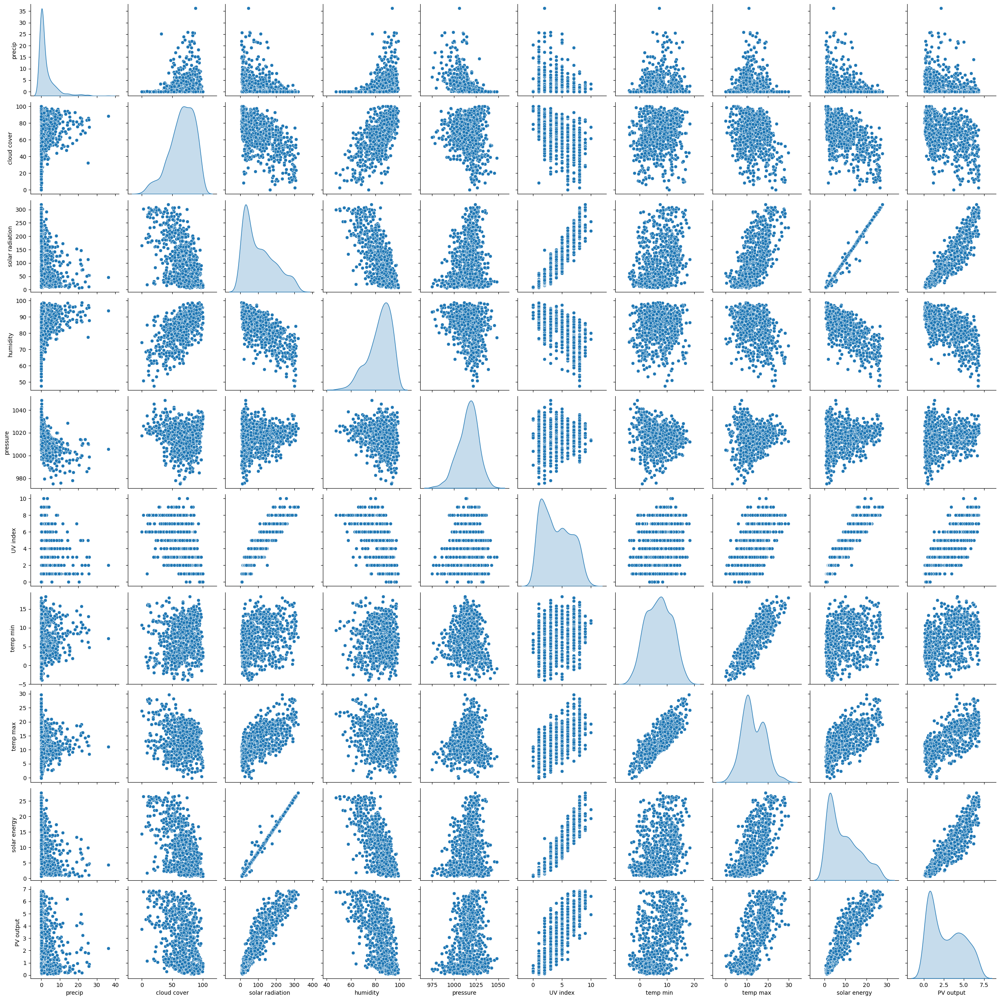

2025-02-14 15:08:57,170 - MainApp - INFO - bar chart to display the count of each of the category values of the UV 


In [ ]:
def data_clean_test():
    logger = Logger('MainApp', 'logs/app.log').get_logger()
    
    data_file = "solarPower_50m.csv"
    
    # Ensuring the file exists in the path
    if not os.path.exists(data_file):
        logger.error(f"The  '{data_file}'is not found in the path")
        return

    # Reading the dataframe
    df_pandas = pd.read_csv(data_file)
    result_pd = DataFrameUtils.load_data(df_pandas, logger=logger)
    result_pd = datacleaningutils.format_clean_columns(result_pd, logger=logger)
    logger.info("Displaying pandas location of the null values")
    datacleaningutils.dist_columns(result_pd, logger=logger)
    datacleaningutils.eda_explore(result_pd,logger=logger)
    
    
    
if __name__ == "__main__":
    data_clean_test()


In [20]:
import pandas as pd
import os
df = data 
df['date'] = pd.to_datetime(df['date'])
df['year'] = df['date'].dt.year
df['month'] = df['date'].dt.strftime('%b') 
grouped = df.groupby(['year', 'month'])
for (year, month), group in grouped:
    year_folder = str(year)
    month_folder = month
    os.makedirs(os.path.join(year_folder, month_folder), exist_ok=True)
    group = group.drop(['year', 'month'], axis=1)
    file_path = os.path.join(year_folder, month_folder, f"{year}_{month}.csv")
    group.to_csv(file_path, index=False)
    print(f"Saved: {file_path}")

Saved: 2019/Dec/2019_Dec.csv
Saved: 2020/Apr/2020_Apr.csv
Saved: 2020/Aug/2020_Aug.csv
Saved: 2020/Dec/2020_Dec.csv
Saved: 2020/Feb/2020_Feb.csv
Saved: 2020/Jan/2020_Jan.csv
Saved: 2020/Jul/2020_Jul.csv
Saved: 2020/Jun/2020_Jun.csv
Saved: 2020/Mar/2020_Mar.csv
Saved: 2020/May/2020_May.csv
Saved: 2020/Nov/2020_Nov.csv
Saved: 2020/Oct/2020_Oct.csv
Saved: 2020/Sep/2020_Sep.csv
Saved: 2021/Apr/2021_Apr.csv
Saved: 2021/Aug/2021_Aug.csv
Saved: 2021/Dec/2021_Dec.csv
Saved: 2021/Feb/2021_Feb.csv
Saved: 2021/Jan/2021_Jan.csv
Saved: 2021/Jul/2021_Jul.csv
Saved: 2021/Jun/2021_Jun.csv
Saved: 2021/Mar/2021_Mar.csv
Saved: 2021/May/2021_May.csv
Saved: 2021/Nov/2021_Nov.csv
Saved: 2021/Oct/2021_Oct.csv
Saved: 2021/Sep/2021_Sep.csv
Saved: 2022/Jan/2022_Jan.csv


In [29]:
dec = pd.read_csv("2020/Aug/2020_Aug.csv")

In [ ]:
dec

,date,precip,cloud cover,solar radiation,humidity,pressure,UV index,temp min,temp max,solar energy,PV output
0,2019-12-01,0.000,72.0,27.9,87.3,1024.4,2.0,0.9,5.4,2.4,0.748
1,2019-12-02,0.120,41.2,NaN,82.0,1032.6,2.0,-1.1,5.8,3.9,1.122
2,2019-12-03,0.000,59.8,42.5,82.6,1027.7,3.0,2.1,8.2,3.7,1.091
3,2019-12-04,0.096,26.2,43.8,90.6,1020.7,3.0,1.0,6.9,3.7,1.060
4,2019-12-05,0.134,85.2,26.5,91.5,1019.4,2.0,1.9,9.7,2.3,0.712
5,2019-12-06,3.340,87.4,19.2,90.7,1008.3,1.0,8.3,11.2,1.7,0.492
6,2019-12-07,0.219,86.7,28.5,89.5,1013.2,1.0,6.9,9.8,2.2,0.776
7,2019-12-08,3.489,67.8,28.4,83.6,1001.2,2.0,5.7,10.8,2.5,0.670
8,2019-12-09,8.222,44.1,32.5,76.6,1013.7,2.0,2.5,8.6,2.9,0.944
9,2019-12-10,6.661,80.7,11.3,90.7,1013.0,1.0,2.4,11.5,1.0,0.078


In [24]:
dec1 = pd.read_csv("2021/Dec/2021_Dec.csv")
dec1

,date,precip,cloud cover,solar radiation,humidity,pressure,UV index,temp min,temp max,solar energy,PV output
0,2021-12-01,4.774,58.8,31.9,82.7,1002.8,2.0,2.7,10.2,2.8,0.866
1,2021-12-02,0.814,48.7,26.8,79.2,1014.3,2.0,-0.9,5.7,2.3,1.104
2,2021-12-03,7.510,87.7,19.4,96.8,1004.6,1.0,2.0,10.0,1.6,0.334
3,2021-12-04,2.584,46.6,24.3,83.1,1001.4,2.0,4.0,6.9,2.1,0.817
4,2021-12-05,0.677,57.3,34.4,78.6,1011.1,3.0,2.5,6.7,2.9,1.051
5,2021-12-06,3.995,64.9,17.3,88.6,1011.2,1.0,0.9,8.4,1.4,0.431
6,2021-12-07,9.580,64.2,12.6,83.7,994.7,1.0,1.8,8.4,1.1,0.247
7,2021-12-08,1.273,63.5,22.6,73.2,993.3,2.0,5.2,6.7,2.0,0.635
8,2021-12-09,3.174,73.6,22.6,84.5,999.9,1.0,3.9,9.6,1.8,0.525
9,2021-12-10,2.090,48.6,24.3,77.1,1003.7,2.0,3.9,7.0,2.2,0.860


In [26]:
dec2 = pd.read_csv("2020/Dec/2020_Dec.csv")
dec2

,date,precip,cloud cover,solar radiation,humidity,pressure,UV index,temp min,temp max,solar energy,PV output
0,2020-12-01,0.319,73.3,40.1,80.9,1027.5,2.0,3.7,8.1,3.4,0.587
1,2020-12-02,0.064,82.4,15.8,90.0,1018.9,1.0,4.4,8.5,1.4,0.617
2,2020-12-03,5.106,81.6,17.3,91.8,989.4,1.0,2.9,5.8,1.5,0.137
3,2020-12-04,1.617,69.4,32.0,84.5,979.5,2.0,2.2,5.6,2.7,0.983
4,2020-12-05,5.090,73.8,16.5,92.9,988.5,1.0,2.3,5.1,1.4,0.462
5,2020-12-06,0.109,63.0,42.6,90.6,1002.4,3.0,0.8,6.3,3.7,0.641
6,2020-12-07,0.126,77.8,20.3,95.2,998.9,1.0,0.1,3.2,1.6,0.631
7,2020-12-08,0.212,61.5,30.4,91.6,1004.2,1.0,0.1,6.5,2.6,0.525
8,2020-12-09,0.618,65.6,15.2,88.8,1005.6,1.0,2.3,7.5,1.2,0.479
9,2020-12-10,9.380,88.7,24.4,95.9,995.6,2.0,7.1,9.5,2.2,0.260


In [ ]:
# treatment of outliers as we can see the pressue is highly negatively correlated with precip we are using precip as the y and pressure as the x for interpolation 

In [82]:

## --- Box-Cox Transformation ---
#for column in numeric_data.columns:
#    # Box-Cox requires positive data
#    if numeric_data[column].min() <= 0:
#        # Add a small constant to ensure all values are positive
#        numeric_data[column] = abs(numeric_data[column])
#        data_boxcox[column] = stats.boxcox(numeric_data[column] + shift)[0]
#    else:
#        data_boxcox[column] = stats.boxcox(numeric_data[column])[0]
# Print the first few rows of all transformed data










# Verify the ranges and statistics
print("\nNormalized Data Ranges (should be between 0 and 1):")
print(data_normalized.agg(['min', 'max']))
print("\nStandardized Data Mean and Std (should be ~0 and ~1):")
print(data_standardized.agg(['mean', 'std']))

Original Data:
    precip  cloud cover  solar radiation  humidity    pressure  UV index  \
0  0.00001     72.00001         27.90001  87.30001  1024.40001   2.00001   
2  0.00001     59.80001         42.50001  82.60001  1027.70001   3.00001   
3  0.09601     26.20001         43.80001  90.60001  1020.70001   3.00001   
4  0.13401     85.20001         26.50001  91.50001  1019.40001   2.00001   
5  3.34001     87.40001         19.20001  90.70001  1008.30001   1.00001   

   temp min  temp max  solar energy  PV output  
0   0.90001   5.40001       2.40001    0.74801  
2   2.10001   8.20001       3.70001    1.09101  
3   1.00001   6.90001       3.70001    1.06001  
4   1.90001   9.70001       2.30001    0.71201  
5   8.30001  11.20001       1.70001    0.49201  

Normalized Data (Min-Max Scaling):
     precip  cloud cover  solar radiation  humidity  pressure  UV index  \
0  0.000000        0.720          0.06624  0.773437  0.731454       0.2   
2  0.000000        0.598          0.11296  0.681

In [74]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

if np.any(data <= 0):
    data = data + 1e-5  
transformed_data, optimal_lambda = stats.boxcox(data['precip'])


In [ ]:
data_standardized['precip'] = transformed_data

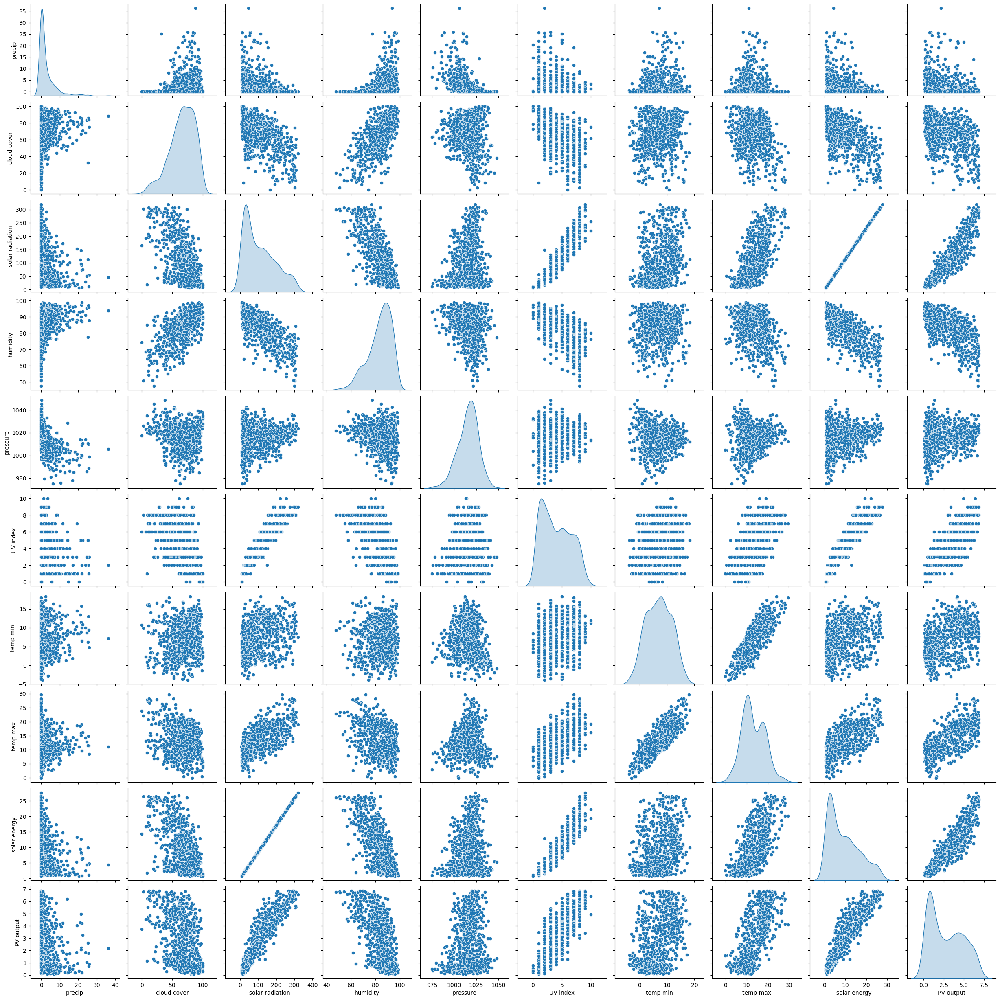

In [38]:
# here are some of the strategies that i undertook to deal with the skewness of the distribution 
# Log transform a single column 
#df[‘col1’] = np.log(df[‘col1’] 
#
## Log transform multiple columns in dataframe 
#df = df[[‘col1', ‘col2']].apply(lambda x: np.log(x))
        



# applying the log transformtion 

#removing the outliers that are outside the 0.05 and 0.95 quantile 
# box cox transformation 

## Q2 - Extracting data using LLMs

The accompanying PDF file is a data sheet that gives specifications for a number of hardware products available from GivEnergy. Use an open source Large Language Model of your choice to run inference optimally on a single or multi-node cluster to extract the data from this pdf to the best of its ability. Please provide a record of the prompts you use in your interaction with the LLM.

